<h1><center>Deviance detection and initial stimulus responses in the somatosensoric thalamocortical pathway</center></h1>
<center> Short project report by Simon Steffens<br><br>06.2020-10.2020<br><br>Supervision by Gwendolyn English and Wolfger von der Behrens</center><br><br><br><br>

## Introduction

## Methods, data processing and implementation details (technical)
#### General folder and code structure 
To pick up with this project and better follow the code description below, a general description of the data directories and scripts is provided here. Scripts with names like `main*.py` are the ones being executed. Code samples in this report will also be limited to snippets from `main` files, excluding function defintions with docstrings. One directory, which is also the one linked to github, has all the scripts, inculding the `main*.py` ones. Whenever a python script is referenced, it can be found in this directory. For adapting this code, one needs to primarily edit `P["outputPath"]` and `P["inputPath"]` in `MUA_init.py` and possibly various seetings in `MUA_const.py`. <br>
To built on top of this code, one should understand the structure behind saving script outputs as well. There must be a base directory `.` that has subdirectories of the structure `./output_*/`where the asterics indicates the dataset from which the output is generated, eg. `./output_gwendata_lowthr`. In there, a subdirectory `MUA_output` should be created. Importantanly, `./output_*/MUA_output` must be set as the value for `P["outputPath"]` in `MUA_init.py`. Any major sub-analysis on the specific dataset should have a directory in this base `./output_*/`.

####  MUA processing pipeline
For this project the original MUA data processing pipeline was slightly modified. The new script `MUA_utility.py` now implements a function `process_data()` that initiates the MUA processing pipeline. This function allows for multicore data processing and partial processing of the data:

In [1]:
def process_data(how={}):
    """
    Runs the processing of the .mcd dirs. If `how` is not passed/ empty, simply
    iterate through all dirs. If `nbatches` and `batch` passed, the dirs are 
    split into nbatches and only the subset batch is run. batch is simply the 
    index of the split dirs. If `threads` is passed, the value of threads will
    be passed the the concurrent.futures.ProcessPoolExecutor to process many dirs
    in parallel. 
    """

In the `main.py` script, `process_data` is imported and run. All `.mcd` directories are iterated in the process_data function. The general hierachy of subsequent scripts is as follows: `process_data(): MUA_cycle_dirs.py -> MUA_core.py -> MUA_functions.py, plotting.py`. <br>
A few addition have been made to the pipeline. Current progress is now printed out in the console. There is the option to save plots using the physical channel location instaed of the original mapping. This enables one to conviently go through plots ordered by channel depth. This option can be found in `MUA_const.py`, `CHNL_TO_PHYSICAL_ORDER=False`, defaults to False. Once all directories have been processed, another function defined in `MUA_utility.py`, `compress_CSVs()`, compresses the generated `.csv` files to `.gzip` for faster access. Here, it is also checked if all mice and paradigms defined in `MUA_const.py` are found in the processed data. One more important feature is implemented in this function. The MUA pipeline generates a `.csv` file with the spike timestamps of each channel. As this can be inconvinient to access, those `.csv` files are merged into one `pandas.DataFrame` and saved as `Triggers_Deviant_negSpikes.gzip`.

In [2]:
from IPython.display import Image

In [ ]:
import os
import MUA_constants as const

if not const.P["outputPath"].endswith('output_lowthr/MUA_output'):
    print('Outputpath wrong for this script? Check MUA_init.')
    exit()

"""Process data """
from MUA_utility import compress_CSVs, process_data
process_data()
compress_CSVs()

#### Artifact trial detection
Another addition to the MUA pipeline was the detection of artifact trials. The covariance across channels for each trial is used to identify overly strong correlation between recording channels. If a trial surpasses a hard fixed threshold, it is set to NA and excluded from further processing. In this case, the preprocessing of the experiment is rerun with the critical trials set to NA, overwriting the previous output. Since the artifact classification needs to be checked by looking at the old raster plots where potential artifact trials are still included, these raster plots are renamed by appending `_PreArtifRemovel.png`. That way, the newly generated raster plots don't overwrite the previous ones. This is especially relevent when setting the approriate covariance theshold at which trials are classified as artifacts. To relate raster plot firing patterns and covariance scale, the covariance heatmap of the experiment is saved as `trial_covariance_Deviant.png`. An example of this can be seen below for `mGE84_30.07.2019_O25C1.mcd`:

In [3]:
# set to something like a 100000 to never delete artifact channels
# importantly, this value is used to compare against the negative firingrate but 
# then slice both the negative AND positive trials. The positive firingrate
# generally follows the pattern of the negative firingrate artifacts (checked visually)
# but is usually a bit lower. If you work with the positive firingrates consider 
# classifying positive and negative seperately.
# For high thresholds like 8, 800, this value should be lowered
ARTIFACT_TRIAL_COV_THR = 100
ARTIFACT_TRIAL_COV_HM_MIN = 0
ARTIFACT_TRIAL_COV_HM_MAX = 200

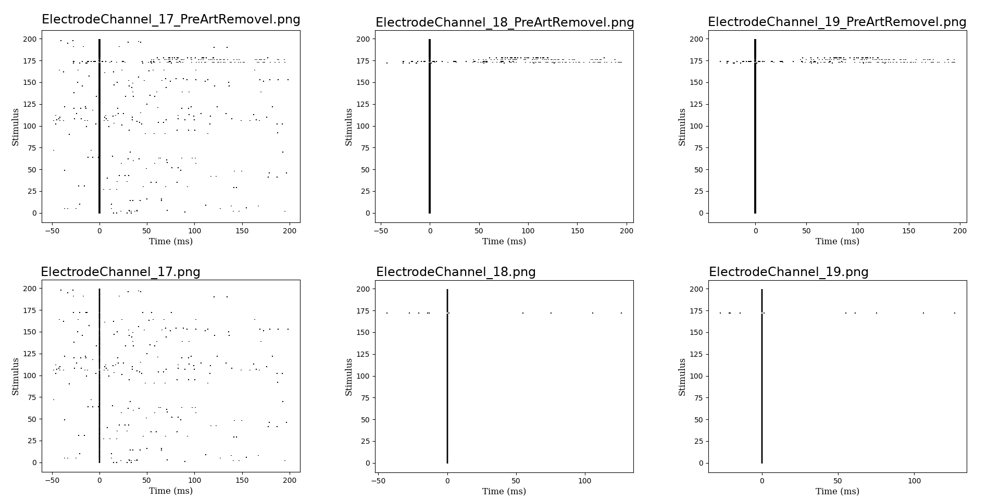

In [4]:
Image(filename= "../report/plots/fig1/fig1_1.png")

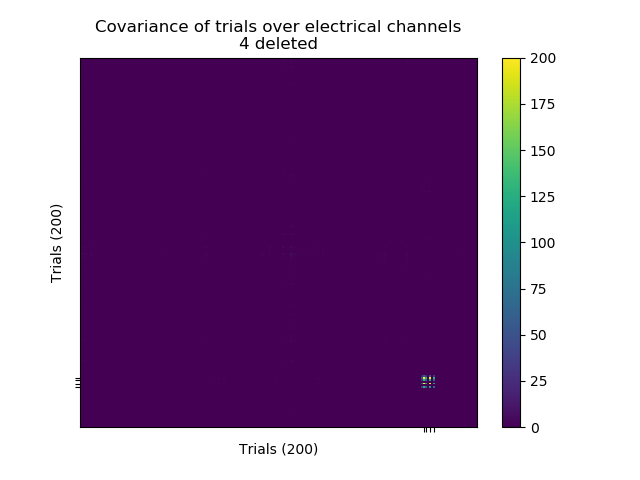

In [5]:
Image(filename= "../report/plots/fig1/trial_covariance_Deviant.png")

#### Implemenation for accessing data
When analyzing the output of the MUA pipeline, we often want to slice specific dimensions in the data. For example, accessing all firing rates of the DAC1 paradigm in all mice and all channels. Therefore, a convenient way to slice the data has been implemented in `MUA_utility.py`. The access method consists of two components: `fetch()` and `slice_data()`. `fetch()` takes in the three major data dimensions mice, paradigms, and stimulus types, and preselects the data based in this input. By default, all the realizations of those dimensions specified in `MUA_const.py` are fetched. A nested dictionary is returned with keys of the structure `mouse-paradigm-stimulustype` and a list of `pandas.DataFrame` as values. This list stores the firing rate, MUA summary, positive spike time stamps, negative spike time stamps, LFP response, and LFP summary, all read from the MUA output directories. LFP data is only added if the LFP analysis was run. If the channels have been mapped to brain regions, the data may also be collapsed at this point. The returned dictionary is intended to be passed to `slice_data()` for slicing to a specific data modality, for example MUA summary. Again, the user may pass lists of mice, paradigms, and stimulus types to slice the data. 

In [10]:
def fetch(mouseids=const.ALL_MICE, paradigms=const.ALL_PARADIGMS, 
          stim_types=const.ALL_STIMTYPES, collapse_ctx_chnls=False, 
          collapse_th_chnls=False, drop_not_assigned_chnls=False):
    """
    Get the processed data by passing the mice-, paradigms-, and stimulus
    types of interst from the saved .gzip`s. Returns a dictionary with key: 
    mouseid-paradigm-stimulus_type and value: (firingrate_df, summary_df, 
    pos_spike_df, neg_spike_df, lfp, lfp_summary). To have the last two elements 
    in the list not set to None, MUA_const.LFP_OUTPUT needs to direct to the 
    output of the LFP analysis pipeline. The DataFrames may be converted from 
    having the 32 channels as rows, to the mapped region indicated by a 
    mapping file. This mapping file should look like this: 
    P["outputPath"]/../chnls_map.csv. When channels are collased to a region,
    the arithmetic mean is taken for firingrate and summary stats. Spike time
    stamps lists of different channels are simply merged together. The mapping
    is controlled by the parameters `collapse_ctx_chnls`, `collapse_th_chnls`, 
    and `drop_not_assigned_chnls`, which should be self explanatory.
    `drop_not_assigned_channels` does only work as expected if both 
    `collapse_ctx_chnls`, `collapse_th_chnls` are passed as True.
    """

def slice_data(data, mouseids=const.ALL_MICE, paradigms=const.ALL_PARADIGMS, 
           stim_types=const.ALL_STIMTYPES, firingrate=False, mua_summary=False, 
           pos_spikes=False, neg_spikes=False, lfp=False, lfp_summary=False,
           drop_labels=False, frate_noise_subtraction='paradigm_wise'):
    """Convenient`s data selection function. Takes in the data (obtained from 
    fetch()) and returns the subset of interst, eg. a specific mouse/stimulus 
    type combination and one of the 6 datatypes eg. by passing firingrate=True.
    Only one data modality can be returned per function call. 
    By default returns the sliced data in the original input format (dict). If 
    `drop_labels` is passed only the values of the dictionary are returned. 
    `frate_noise_subtraction` is only relevent for the case where 
    `firingrate`=True. The string you pass here is passed to the 
    `subtract_noise()` function as the `method` parameter. Valid methods right 
    now are `paradigm_wise` and `deviant_alone`. Check the `subtract_noise()` 
    function for details.
    """

NameError: name 'const' is not defined

#### Firing rate base level subtraction
The `slice_data()` function implements the option to subtract the base firing rate from the stimulus trace. Two methods are implemented in the `subtract_noise()` function. Both of them calculate the average firingrate 50 ms pre stimulus onset of the "Standard" stimulus and subtracts this value from the stimulus trace. While the paradigm-wise method computes the base activity for each paradigm seperately, the deviant-alone method computes one general average base activity from the deviant alone paradigm. Examples that show the necessity of these methods and code to reproduce the plots are shown below. The `firingrate_noise_timeline()` function plots the binned firingrate over the experimental timeline for each mouse. 
This enables the user to identify time variant noise. Clearly, using the deviant alone paradigm as a baseline as shown in the middle plot, noise is insufficiently subtracted. Especially when the DAC paradigm differs vastly from the rest (for example in mGE84), the base levels mismatch the general noise patterns. To show how well the base line matches, the bar plot on the right indicates the proportion of bins in the neagtive range after background subtraction. In a real use case, background subtraction would evaluate these cases as 0 firing. Using paradigm-wise baselines as shown in the bottom plot, both the thoroughness in noise reduction and proportion of negative bins improves. One might consider not subtracting background activity when investigating predictive firing pre stimulus onset. We settled on using the paradigm wise method. 

In [21]:
def subtract_noise(firingrate, method, mouse_id, paradigm):
    """Takes in a firingrate dataframe and subtracts the baseline activity which
    is defined by the `method` passed. Firingrates that fall below 0 after base
    line subtraction are set to 0.  
    method = `deviant_alone` will read in the DA paradigm for the respective 
    mouse and calculate a mean firingrate based on the 50ms pre stimulus. 
    This is done seperately for C1 and C2 paradigms. MS is processed using the 
    mean between C1 and C2 baselines.
    method = `paradigm_wise` will get the standard stimulus type of the paradigm
    the input belongs to. For paradigms without a standard stimulus: deviant 
    alone will use the deviant as a baseline, MS uses the mean prestim 
    firingrate across the four standards."""

In [ ]:
"""Noise subtraction over experiment timeline"""
from plotting import firingrate_noise_timeline
firingrate_noise_timeline(dest_dir_appdx='../plots/firingrates_heatmaps')
firingrate_noise_timeline(dest_dir_appdx='../plots/firingrates_heatmaps', fname_postfix='_parad_subtr', subtr_noise='paradigm_wise')
firingrate_noise_timeline(dest_dir_appdx='../plots/firingrates_heatmaps', fname_postfix='_deviant_subtr', subtr_noise='deviant_alone')

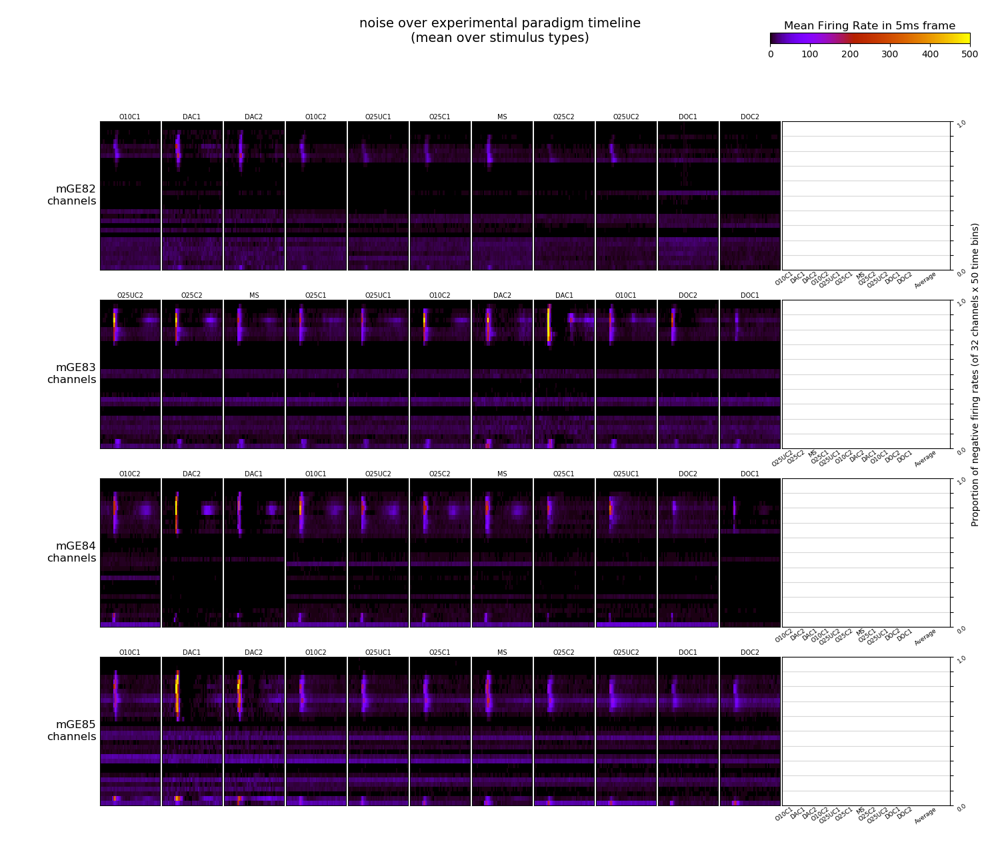

In [20]:
Image(filename= "../report/plots/fig2/firingrate_over_time.png")

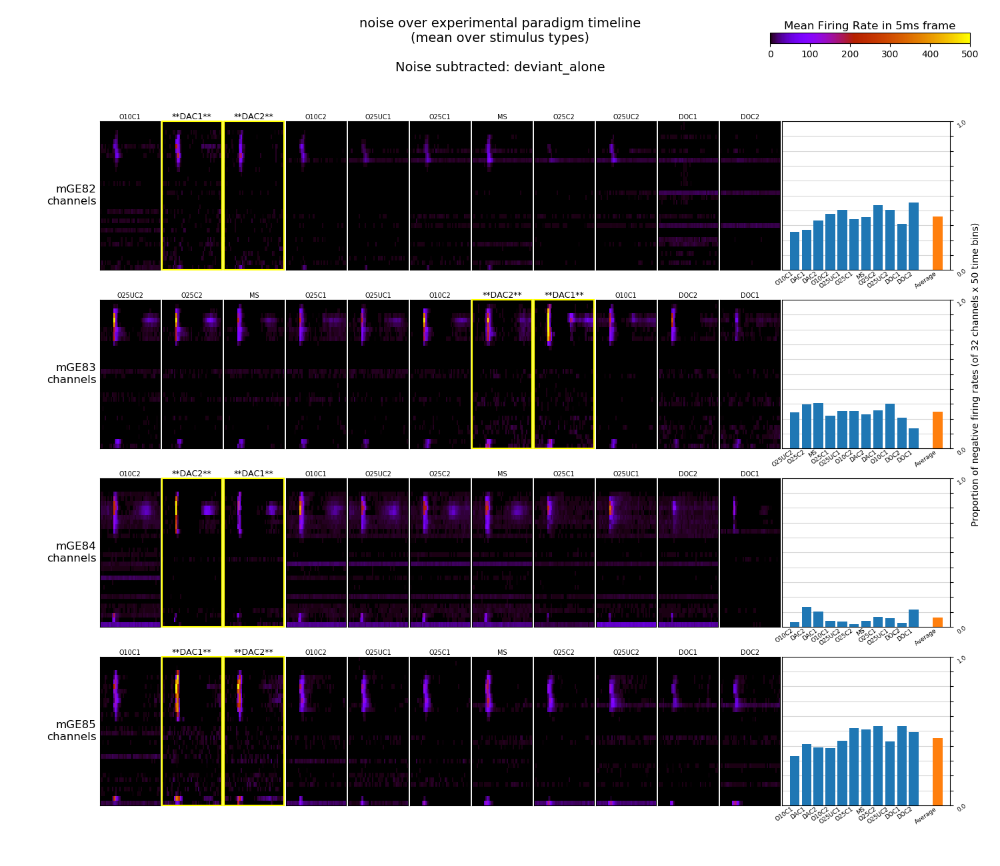

In [18]:
Image(filename= "../report/plots/fig2/firingrate_over_time_deviant_subtr.png")

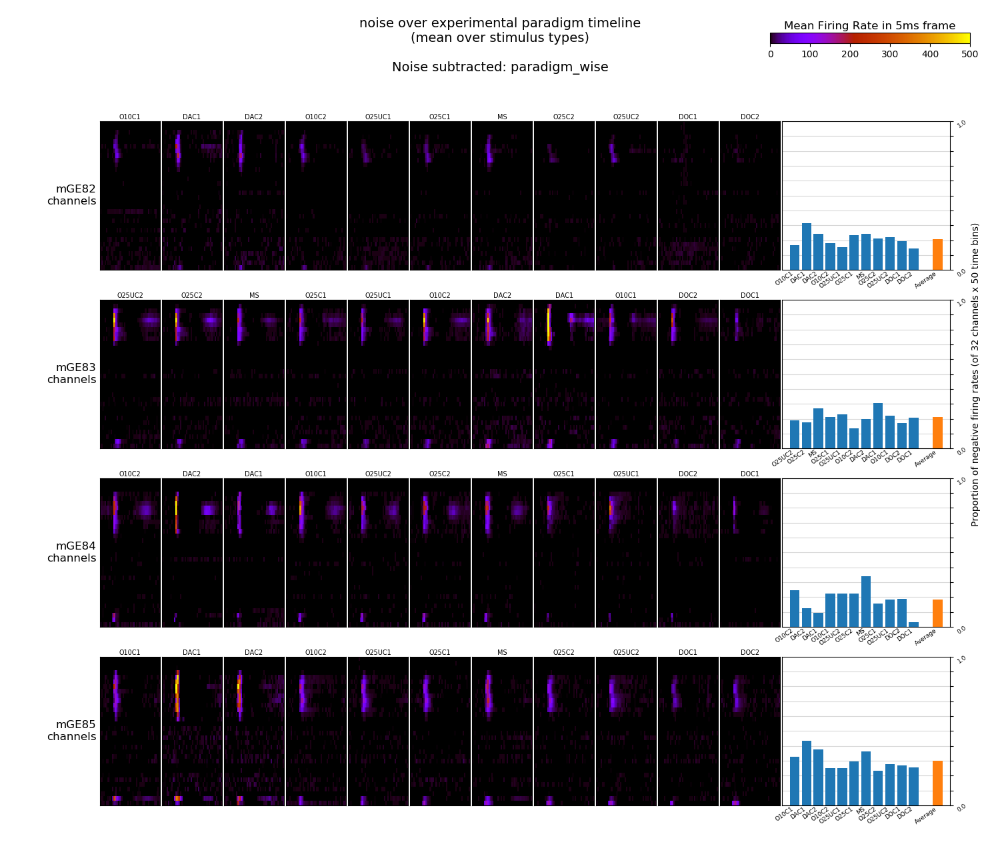

In [19]:
Image(filename= "../report/plots/fig2/firingrate_over_time_parad_subtr.png")

#### Channel mapping implementation
To make meaningful comparisons between animals on a channel by channel basis, deviations in the elctrode placement need to be considered. Instead of comparing for example channel 7 across mice, we are may want to compare brain regions, like the granular cortical layer. To optimize this channel-to-region mapping process, the two functions `cortical_mapping_panel()`, and `thalamic_mapping_panel()` were implementated in `map_channels.py`. Both create a panel with a collection of plots that should enable the user to make an informed mapping decision. For more details please have a look at the function docstrings. 

In [7]:
def cortical_mapping_panel(dest_dir_appdx='../'):
    """ 
    This function copies and creates a collection of mapping-relevent plots and
    makes one panel to compare them easily. For each mouse-paradigm, a subfolder
    is created in P["outputPath"]/dest_dir_appdx and populated with the CSD 
    heatmap & CSD lineplot (copied over), a scatter plot showing the amplitude 
    and timestamp of the first LFP post stim, and lastly, an average firingrate 
    heatmap for each channel 100ms post stim. Finally, a table is printed out 
    that contains the assigned cortical region. This table is initialized empty 
    at P["outputPath"]/../chnls_map.csv. The idea is to go over these summary 
    panels one by one and fill the channel-to-cortical region table along the 
    way. chnls_map.csv should be filled wth values SG, G, IG, dIG. When this 
    function is rerun with the table populated, the table on the summary panels 
    updates to show the assigned cortical region and therefore serves as a handy
    documentation how the channels where assigned. Finanlly, the summary plots 
    are copied into a newly craeted directory 
    P["outputPath"]/dest_dir_appdx/all_panels. 
    """
    
def plot_first_response(dest_dir_appdx='../', which_paradigms=['DAC1', 'DAC2']):
    """
    This function plots a comparison between first responses in the different 
    channels. This information is taken from MUA summary (AvgTimetoFirstSpike) 
    and LFP summary (`Peak_neg_ts`). These plots are used in the panel for 
    defining thalamic channels using the function below. `which_paradigms` 
    selects the paradigms to plot, defaults to [`DAC1`, `DAC2`]. If all paradigms
    should be plotted, you could pass const.ALL_PARADIGMS. The plots are saved 
    as usual at P["outputPath"]/dest_dir_appdx/
    """

def thalamic_mapping_panel(dest_dir_appdx='../', which_paradigms=['DAC1', 'DAC2'], 
                    anatomy_dir=None, ts_plots_dir=None):
    """
    This function creates a panel similar in style to the one produced in 
    cortical_mapping_panel(). The panel has the LFP respones plotted for the
    thalamic channels, firingrate plots, shows the injection slice, and the 
    timestamp of first response. Again, which_paradigms controls the paradigms
    being plotted, by default DAC1, DAC2. Both `anatomy_dir` and `ts_plots_dir`
    need to be passed for the panel to include these. Note that both need to be
    passed, even if you're note interested in one of them in order for them to 
    be drawn. The `anatomy_dir` should have files of the form `mouse.png`, eg.
    `mGE82.png`, ts_plots_dir is simply the output dir of the previous function,
    first_response(). Plots are saved as usual at P["outputPath]/dest_dir_appdx.
    Note that the function expects that cortical mapping to be done. The same 
    file as the one used for cortical mapping is referenced: 
    P["outputPath"]/../chnls_map.csv. Subsequent scripts expect `VPM` as the 
    label of this thalamic mapping.
    """

In [ ]:
import MUA_constants as const

"""Mapping cortical and thalamic channels"""
from map_channels import cortical_mapping_panel
from map_channels import plot_first_response
from map_channels import thalamic_mapping_panel

cortical_mapping_panel(dest_dir_appdx='../cortical_mapping')

first_response_dir = '../first_response'
plot_first_response(dest_dir_appdx=first_response_dir)
anatomy_dir = '/media/loaloa/gdrive/projects/ephys/metadata/Histology_pngs'
thalamic_mapping_panel(dest_dir_appdx = '../thalamus_mapping', 
                       anatomy_dir = anatomy_dir,
                       ts_plots_dir = f'{const.P["outputPath"]}/{first_response_dir}')

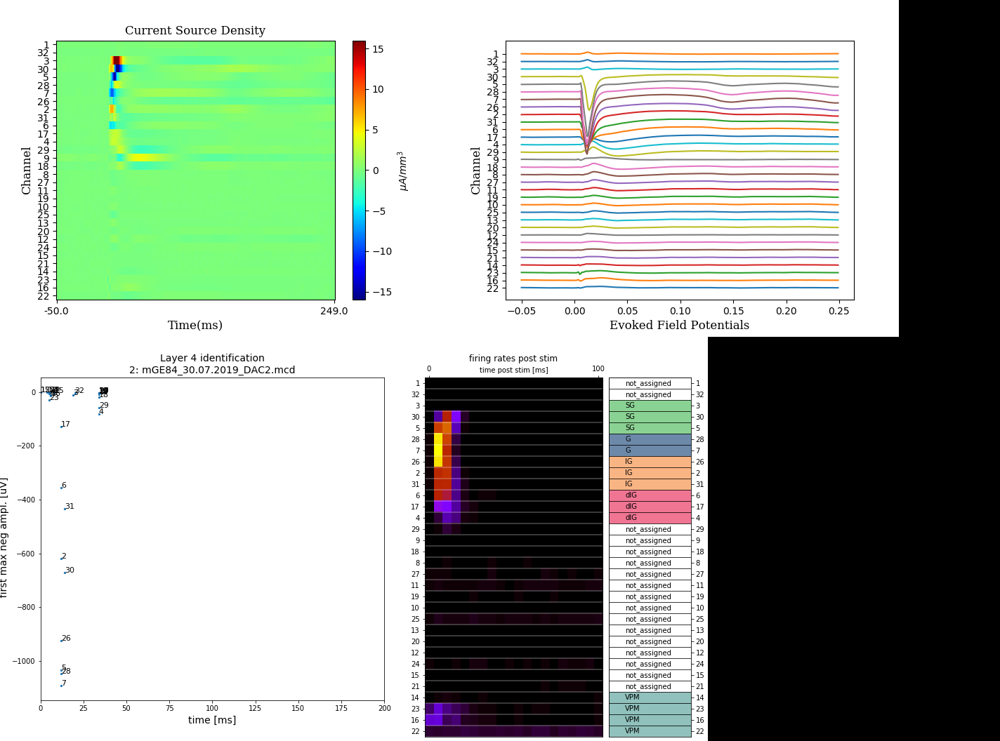

In [8]:
Image(filename= "../report/plots/fig3/CSD_summay_plot_mGE84_2_DAC2.png")

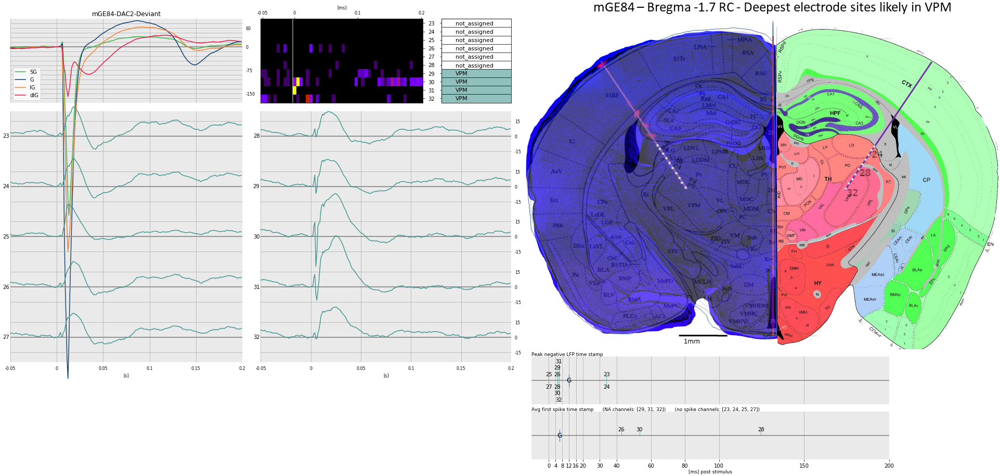

In [9]:
Image(filename= "../report/plots/fig2/mGE84_2_DAC2.png")

#### Channel mapping approach
The top panel is an example of `mGE84 DAC2` and is created by calling `cortical_mapping_panel()`. The cortical mapping relies significantly on the current source density (CSD) analysis, which is located in the top left corner of the panel. Particuarly the granular layer is consistently characterized by a negative CSD value post stimulation. To further back up the classification of the granular layer, a plot relating the timestamp and amplitude of the initial response is added in the bottom left corner. We expect the channels located in the granular layer to have early and high amplitude responses, hence, they should appear on the bottom left of the plots. Correctly defining the granular layer is of major importance as we strictly classify adjacent layers based on it. Concretely, three channels above the grnular layer are set as supragranular, the six channels below as infra-, and deep infragranular layers. <br>
Further, the evoked field potentials are plotted in the top right corner. Of course, this requires the user to run the LFP pipeline, which was not modified in this project. The LFP response can be a useful indicator for channels outside the neocortex. In this case, we expect a postive potential similar  to an EEG signal. Lastly, the binned firing rate 100 ms post stimulus is shown to obtain a perspective on the general  response magnitude across channels. In the current implementation, this also includes deep thalamic channels. When this function is run for the first time, the table showing the assigned region will be filled with `not_assigned` values. The intented workflow would involve the user to map the channels by editing the created mapping file. Once the `not_assigned` labels are replaced with a value, for example `G`, rerunning the function will create the table with populated values and region specifc colors defined in `MUA_constants.py`. Therefore, the panel additionally serves as documentation for evidence based channel assignments.<br><br>
The bottom panel is produced by calling `thalamic_mapping_pannel()`, again showing `mGE84 DAC2` as an example. Since the sensory thalamus has very sparse inner connectivity, CSD analysis cannot be used to assign channels here. Evoked local field potentials and spike bins are shown on the left half of the panel. Especially channels 31 and 30 exhibit a clear spiking and LFP signal in response to the stimulus. Together with anatomical observations on the top right, we may assign these channels to VPM. Lastly, at the bottom right, specifically the initial responses are plotted. While channel assignments are more challening in thalamus, the intended workflow is the same as assigning cortical channels.  

#### General purpose visualizations

One of the most used basic viualizations to check more involved analysis results were firing rate heatmaps, produced by the `firingrate_heatmaps()` function. One already shown use was for example analyzing the development of background activity over the experiment. To be presice, the noise develpment does have its own implmentation `firingrate_noise_timeline()`, but the plot shape is conserved. A handful of different compositions are implmented that either plot an entire exeriment including the stimulation of both C1 and C2 (paradigm wise), or present the stimulation of one whisker in different paradigm contexts. The latter visualization proved to have more use cases.<br> For the investigation of SSA, a function for adaptable computation of SSA indices from data, a scatter plot showing SSA indices, and region-specific SSA correlation plots were implemented. For details regarding these functions refer to the docstrings below. 

In [ ]:
def firingrate_heatmaps(dest_dir_appdx='../', subtr_noise=False, all_stimuli=False,
                        grouping='whisker_wise', chnls_to_regions=False):
    """Generate a panel of firing rate heatmaps for all mice. The specific split
    regarding the paradigm is controlled by `grouping`. By default, this equates
    to `whisker_wise` which will make a plot for each paradigm but importantly,
    pooled such that only one whisker is stimulated. This means for example for 
    the panel of O10C1, the deviant of O10C1 is plotted plus the Standard in 
    O10C2. This way, the effect of the paradigm on one whsker, here C1, is 
    ideally visualized. When grouping equals `whisker_wise_reduced`, the 
    Predeviant and Postdeviant are cut, but one big panel showing all paradigms
    for each whisker is produced. This is gives a high level overview of 
    differences between paradigms. Lastly, grouping may be passed as 
    `paradigm_wise` which simply takes an experiment and plots the
    Deviant and Standard found in there. For O10C1, the Deviant column would 
    corresbond to C1 stimulation, the Standard columns to C2 stimulation. This 
    is an old option that is not really that useful.  `subtr_noise` may be 
    passed as False (default), 'paradigm_wise' (recommended) or 'deviant_alone'.
    When `chnls_to_regions` is passed as True (defaults to False), the channel
    mapping file is used to collapse channels to regions. The heatmaps then have
    5 rows instead of 32. `all_stimuli` will include postdevient and standard 
    stimuli, by default, only predevient and devient are plotted (2 columns).
    Currently only implemented for grouping=`whisker_wise`.
    Plots will be saved as usual at P["outputPath"]/dest_dir_appdx/* """

def compute_si(data, MS=False, start=5, stop=20):
    """
    Compute the SSA index for given data, with data being in the form of the 
    output of fetch(). `start` and `stop` indicate the window of activity 
    that is used to compute the average firing rate response. By default,
    The Devient in the Oddball paradigm is compared with the Predevient. If
    `MS` is passed as True however, the Devient setting of the whisker is 
    compared with the MS setting of the whisker. In the 82-85 data, the C1 and
    C2 data seems flipped, tehrefore, the code here corrects for that. In a data
    set that doesn't have this problem, this should be switched back. When the
    responses are calculated there is a miniimum level of activity required to
    make it count as a valid SI. This value is set in MUA_constants.py, 
    SI_MIN_FRATE_5MS, it refers to the minimum number of spikes in a 5 ms frame.
    By default, this value is set to 1. The distribution of responses together 
    with this cut off value are plotted in the `oddball_si()` function as well.
    Returns three data frame, first one is the SI indices, second one is the 
    devient and standard reponses in a string, the last one is the raw values 
    themselves.
    """
    
def oddball_si(dest_dir_appdx, which='O10', compare_with_MS=False, start=5, stop=20):
    """ Plot the SSA index of a specific paradigm. The paradigm is passed to 
    `which`, it may be `O10`, `O25` or `O25U`. By default the SSA index is 
    calculated by comparing the devient response to the predevient (standard). 
    The response is defined as the average firing rate in a given time interval
    post stimulus. This interval is passed by `start` (default 5) and `stop` 
    (default 20). The SSA index may also be calculated using the many standards
    paradigm. Instead of comparing with the standard presentation of the whisker,
    the stimulation of the whisker within the MS paradigm is used. This is done
    by passing `compare_with_MS` as True. Details on the compuation of SSA 
    indecis can be found in the doctring of the MUA_utility.py function 
    `compute_si()`. Besides the main plot, a histogram of respones is saved to
    check the general magnitute of responses. All plots are saved at 
    P["outputPath"]/dest_dir_appdx/*.
    """
    
def ssa_correlation(dest_dir_appdx, which='O10', start=5, stop=20, post_stim=False):
    """Plot the correlation of SSA indices. Each mouse has two SIs, one for C1,
    one for C2. With 4 mice, we get a vector of 8 datapoints that are then 
    correlated in different regions. If one of those 8 is NA, it is excluded 
    from the correlation. At least 4 values must be present for the correlation 
    of two regions. A heatmap is drawn showing pearson's rho coefficient. To
    check if the correlation looks reasonable, for each combination of regions,
    a plot is drawn that shows the SIs and a fitted regression line. The 
    paradigm is passed in `which`. `start` and `stop` also work as mentioned 
    before. `post_stim` may simply be passed as True to include late responses 
    that are hard fixed in the code to late_start=100 and late_stop=200. This 
    essentially extends the regions domain from G, IG .. to G, IG, ... late_G, 
    late IG.... Often for late responses the cut off response constant 
    should be lowered. Therefore, post_stim can also be a number that will 
    be subtracted from the value defined in MUA_constants.py SI_MIN_FRATE_5MS. 
    Plots are saved at P["MUA_ouput"]/dest_dir_appdx/*
    """

#### Onset-offset analysis pipeline

## General description of the data
The dataset this project initally and mainly focused on consisted of four adult mice, mGE82-mGE85. These mice were recorded with a 32 mm, 32 channel electrode traversing C1 barrel cortex up to VPM. Eleven oddball paradigms invloving the stimulation of "Deviant" and "Standard" whiskers were performed to investigate deviance detection in VPM and primary sensory cortex. <br>
For the MUA analysis, the data was high-pass filtered at a cutoff frequency of 500 Hz. Spikes were then selected at a threshold of 5 standard deviations. The output of this analysis can be found in `output_lowthr`. 

#### Firingrates
We first looked at firingrates in DAC and DOC paradigms to analyze the general stimulus response pattern. `mGE82` has clearly the weakest response of the four mice. Stimulating the "Deviant" whisker yields a notable cortical response, but thalamic spiking is barely picked up.  When only the "Standard" whisker is stimulated, the response is particuarly weak. Responses between principal whisker C1 and adjacent whisker C2 are quite symmetrical, however as we expect, the C1 response seems slightly larger. In the second mouse, `mGE83`, we see a strong response when the stimulus is presented. As expected "Deviant" stimulation yields higher responses than providing the "Standard" stimulus. Also, the drop in activity from principle whisker to adjacent whisker is more pronounced, indicating that the electrode hit C1 centrally. In this mouse, we also observe a notable late response that follows the inhibitory period from approximately 100 ms to 200 ms. This is, with varying magnitudes, observed in C1, C2, "Deviant"- and "Standard" stimulation. Besides this, thalamic spiking is picked up across these four experimental settings as well. `mGE84` is a bit of an outlier as the principle whisker response is smaller than the adjacent whsiker response. This is likely due to a slightly misplaced electrode located rather in the C2 barrel than C1.  One needs to keep in mind that the barraloid C1/ C2 response does not relate to the cortical C1/C2 reponse as we have no control where exactly the electrode hits VPM. In this mouse, C1 stimulation yields higher responses in sensory thalamus than C2. The last mouse `mGE85` has a similar response pattern as `mGE83`, following the expected response pattern. C1 responses are larger than C2 ones, however the difference is smaller than in `mGE83`. One may assume that the elctrode is closer to the C2 barrel here. `mGE85` differs from the rest of the mice by its high spike frequency in VPM, both for C1 and C2. Also, this mouse does not exhibit the late response between 100 ms and 200 ms primarily seen in `mGE83` and `mGE84`.

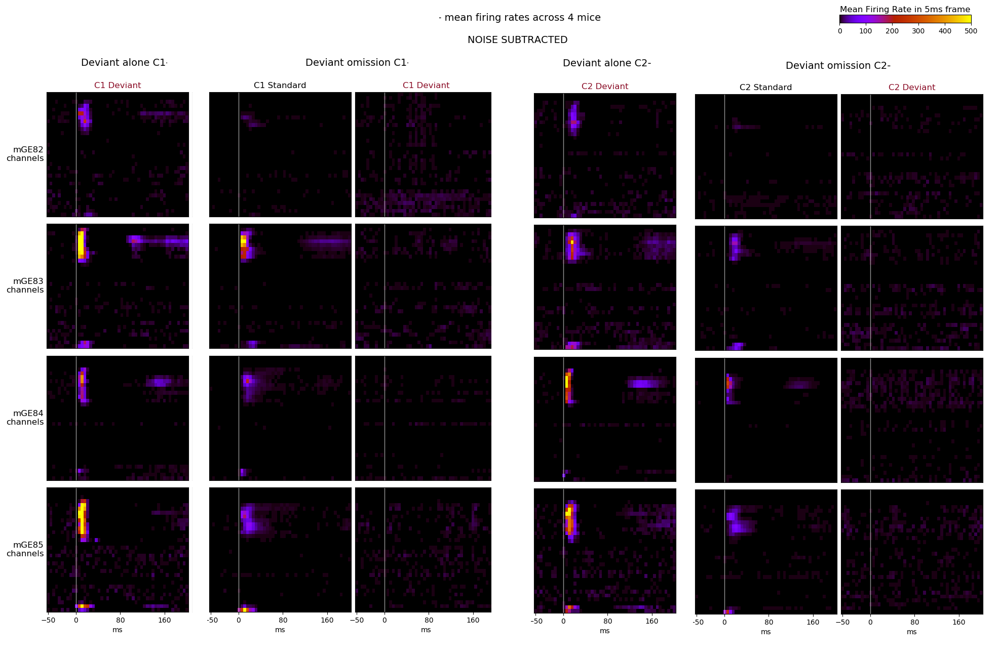

In [3]:
Image(filename= "../report/plots/fig4/panel1.png")

#### Many Standards (MS) paradigm
When investigating the general response and electrode placement, the MS paradigm holds valuable insights. However, the MS response pattern here stands in sharp contrast to all other paradigms. Specifically, the responses to C1 and C2 are the exact opposite than what we would expect from the previous figure. To recap, `mGE82`, `mGE83`, `mGE85` respond most strongly to stimulating the C1 whisker, `mGE84` the C2 whisker. Surprisingly, in the MS paradigm, this is exactly mirrored. The two bottom figures illustrate this observation most clearly. Equivalent to the figure discussed above, the firingrate in response to stimulating one whisker (C1 middle plot, C2 bottom plot) is shown. In addition to DAC and DOC, MS and the oddball paradigms are included. Clearly, the MS firingrates break the pattern in C1 vs. C2 responsivenss. As pointed out above, the C1 and C2 responses seem flipped. I personally conclude this to be an error in the code, likely very early in the pipeline. This was unfortunately detected only very late in the project, thus this issue was left unresolved. Perhaps the decompression of raw files could be a starting point for tracing out this bug. 

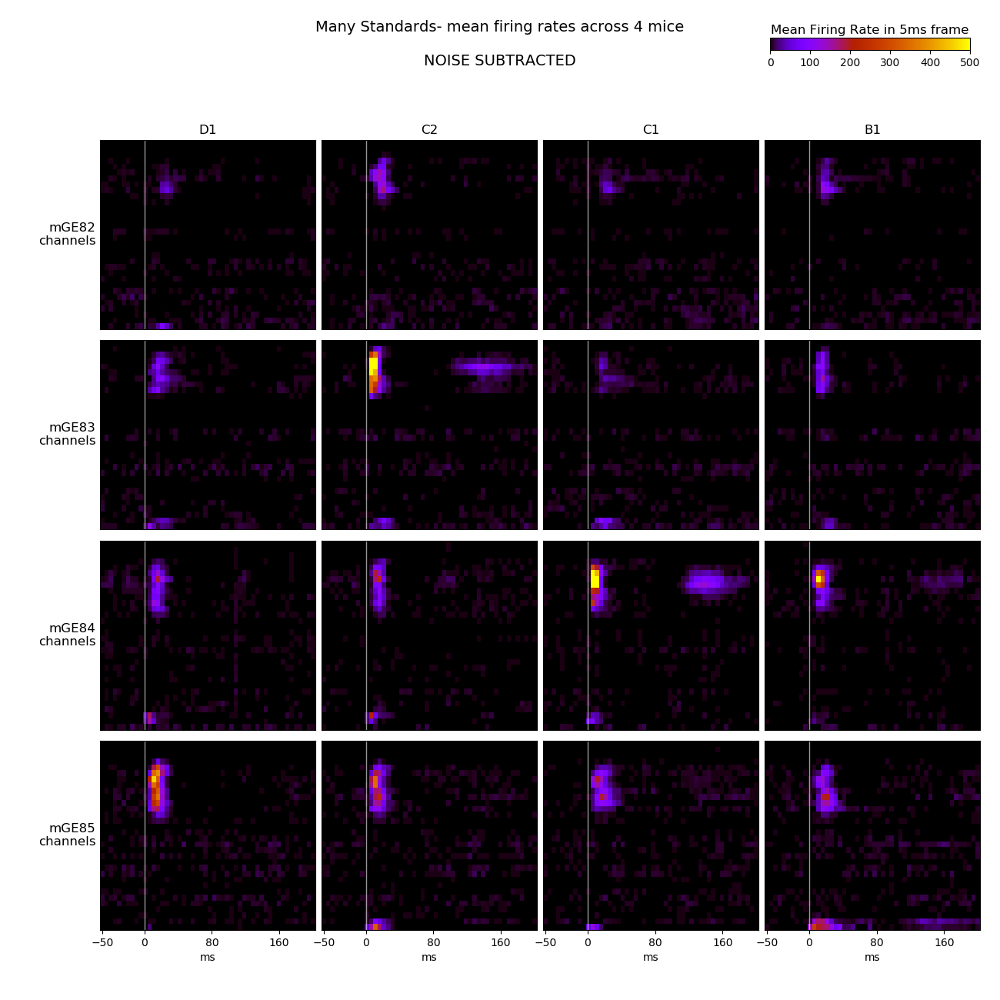

In [4]:
Image(filename= "../report/plots/fig4/MS_allStimTypes.png")

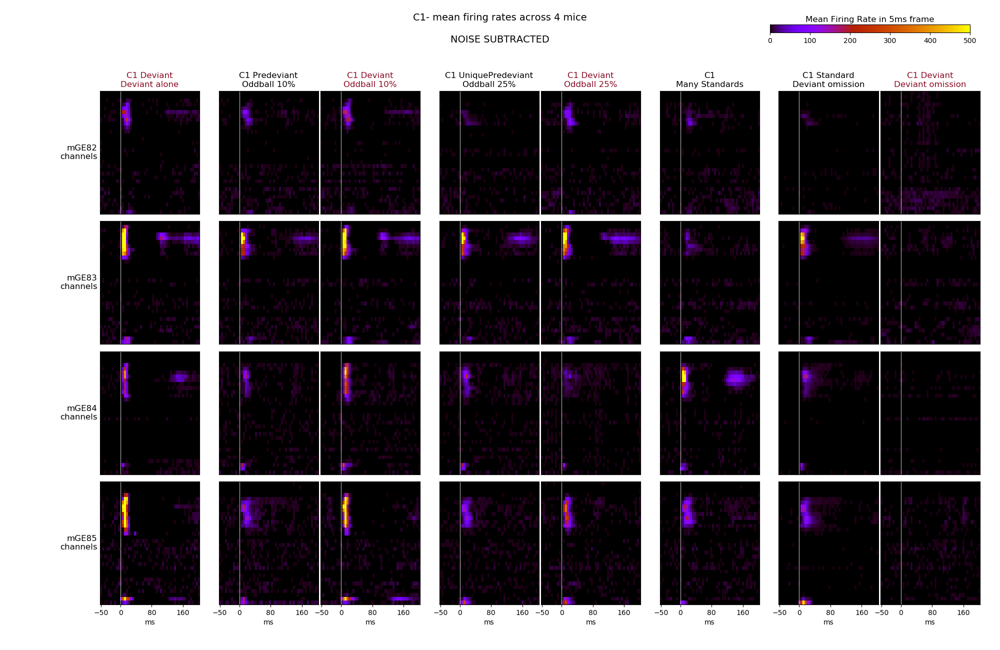

In [5]:
Image(filename= "../report/plots/fig4/C1_allStimTypes.png")

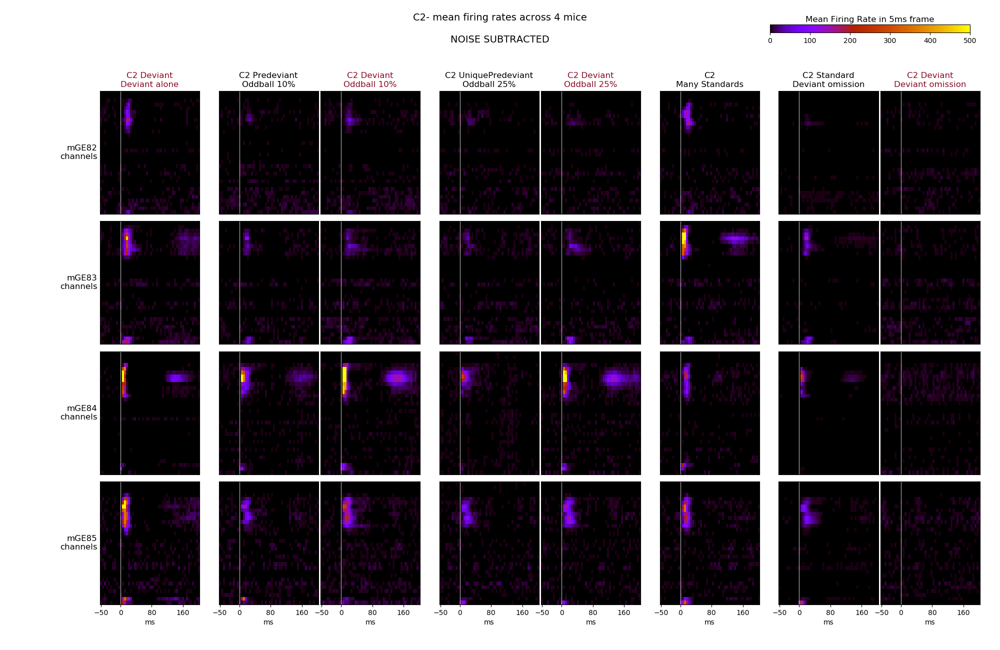

In [6]:
Image(filename= "../report/plots/fig4/C2_allStimTypes.png")

#### Stimulus specific adaptation (SSA)
One of the central goals of ths project was the investigation of SSA, focusing on thalamic effects in particular. The paradigms specifically designed to investigate SSA are oddball 10%, and oddball 25%, both of which are shown below for C1 (top) and C2 (bottom), this time with region-collapsed channels. When the "deviant" whisker is presented both 10% and 25% of the time, most mice show an increased cortical response with a few notable exceptions. When C1 is the "deviant", `mGE84` shows a decreased response in the 25% case. `mGE83` has a similar response pattern but when C2 is the "deviant". In VPM, there no easily dicernable qualitative effect, but generally, responses follow the cortical pattern. Late respones in the time window of 100-200 ms are mostly limited to `mGE83`;C1 and `mGE84`;C2 in G and IG layers. This late reponse also seems to increase when when the whisker is stimulated as the "deviant".  More patterns can be found in the figure below, but it is more convienient to reduce information a step further, specifically plotting the increase in firing when the "deviant" is presented (see below). All SSA effects described below can be found in the heatmaps as well. It may be interesting for the reader to identify and confirm the results below in the firingrate heatmaps. 

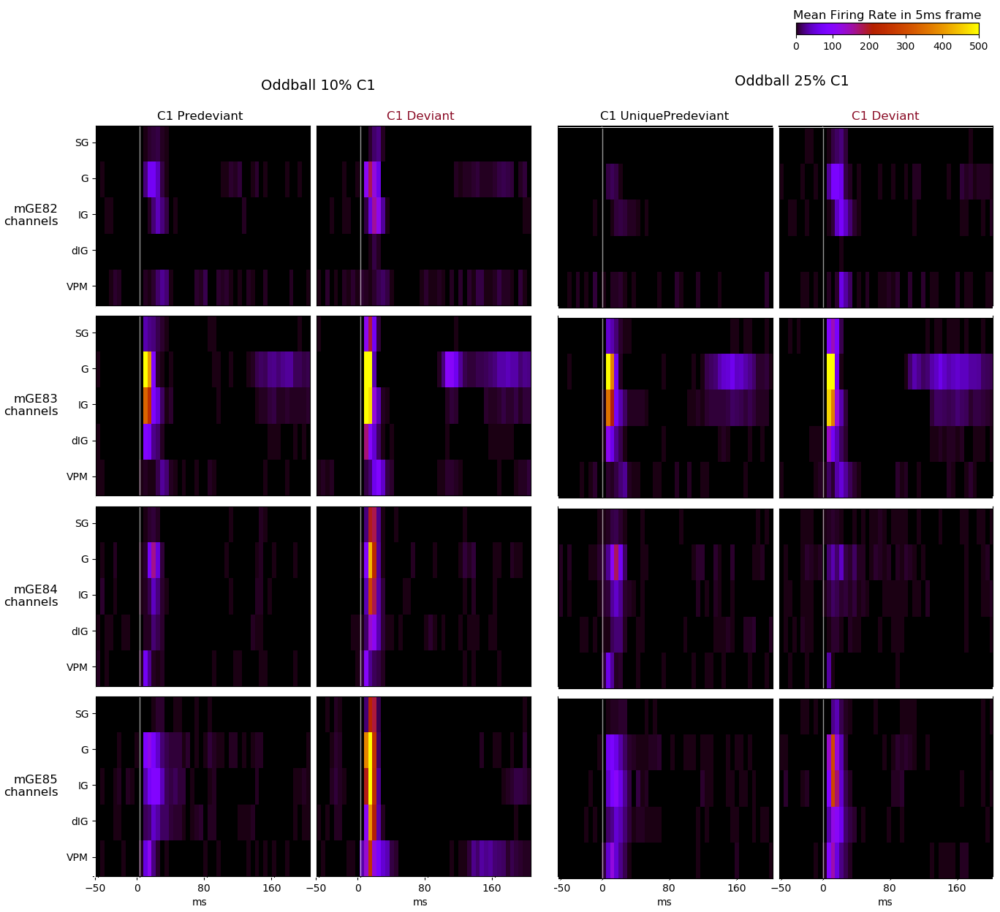

In [10]:
Image(filename= "../report/plots/fig5/C1_fig.png")

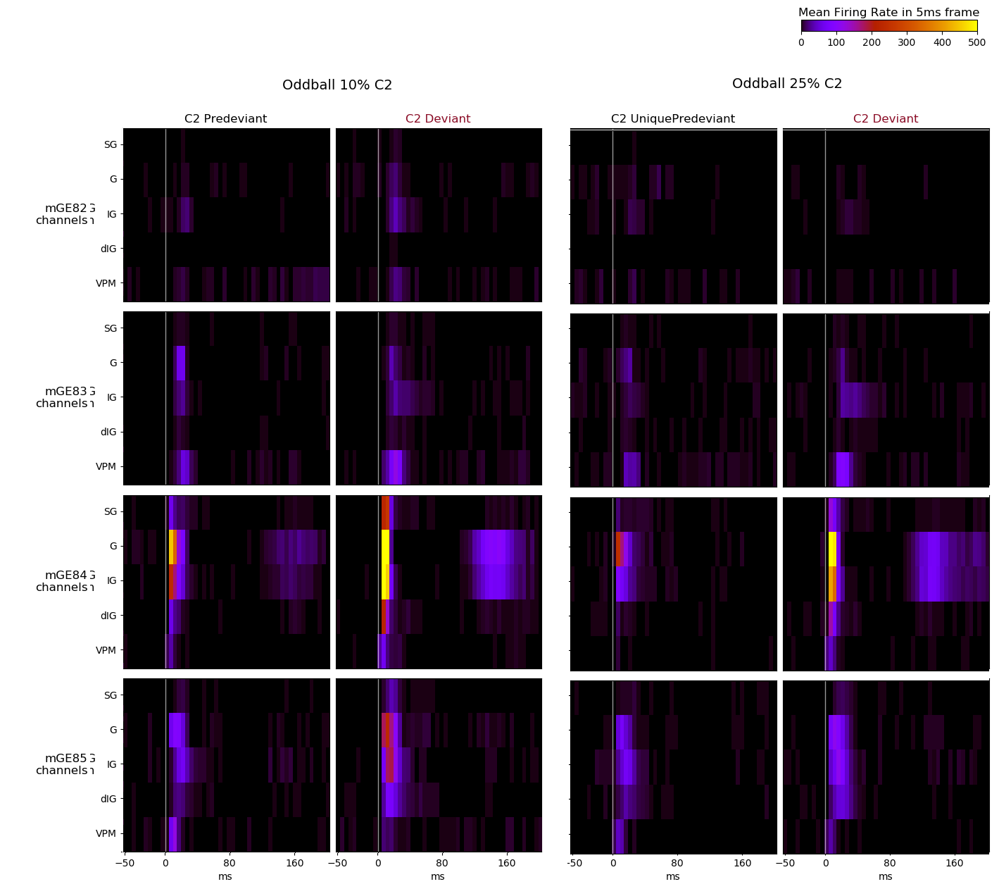

In [9]:
Image(filename= "../report/plots/fig5/C2_fig.png")

#### SSA indices methodology
We define SSA indices as the ratio between differential reponse of the "deviant" compared to the "standard", and the sum of the two responses. In this analysis, we compute the response by averaging the firingrate from 5 ms to 20 ms post stimulus. In total we obtain eight SSA values per region as we have four mice times two whiskers (C1, C2). These eight values corresbonds to one column pair when the two figures above are stacked on top of each other. The "predeviant" stimulus was used for computing the "standard" response since we expect the maximum adaptation here.<br> 
Especially when SSA values are calculated for late responses, many small values are encountered such that the SSA index quickly goes to 1 or -1. In an extreme case where the "deviant" response is 1 spike within the time frame, versus no spikes in the "standard", the index evalues to (1-0)/(1+0) = 1. We want to ideally filter out these low responses. This was done by setting a hard threshold on the response required for a valid SSA index, namely an average firingrate of 1 spike per 5 ms frame. For each SSA plot, the distribution of responses is generated as well. That way, a reasonable cut off value can be choosen. Below is an example of the oddball 10% SSA indices in the inital response 5-20 ms, where two responses in `mGE82` fell under this threshold. We can see in the right plot at the bottom that these low responses belong to the SG layer. 

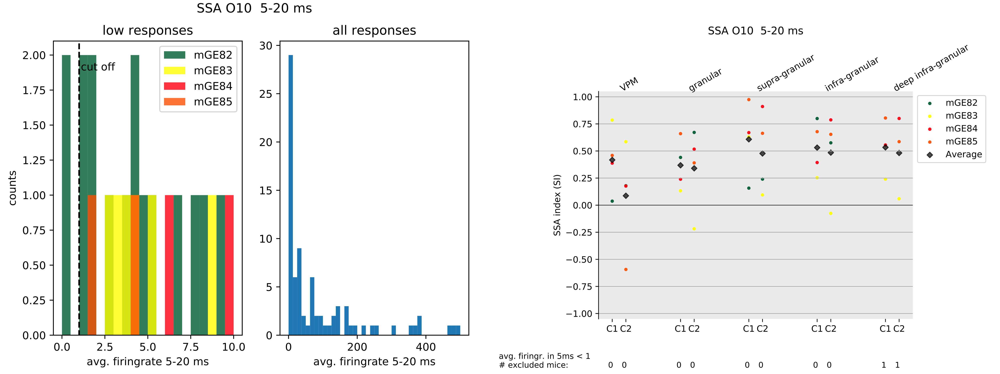

In [11]:
Image(filename= "../report/plots/fig5/SSA_index.png")

Another measure was taken to improve the analysis quality in this data set. As seen before in the firing rate heatmaps, `mGE84` responds stronger to C2 stimulation than C1, likely due to a misplaced electrode. Therefore, for the SSA values below, C1 and C2 indices were flipped for `mGE84`. The annotation of the plots below should therefore say "responsive whisker" rather than C1 (principle whisker). "responsive whisker", or  "responsive barrel", can be understood as the whisker/ barrel where the electrode is actually placed. Hence, for the plots below, C1 refers to the directly measured barrel, C2 to the adjacent barrel. For all mice except `mGE84`, this coincides with the actual labels C1 and C2. An illustration of this swap is shown below for the 25% paradigm. One can see how the C1 and C2 responses across mice reduce in variance. <br>
Lastly, as mentioned above, the MS paradigm seems flipped in C1 and C2. Therefore, when comparing with MS, C1 was compared with C2 MS and C2 with C1 MS.

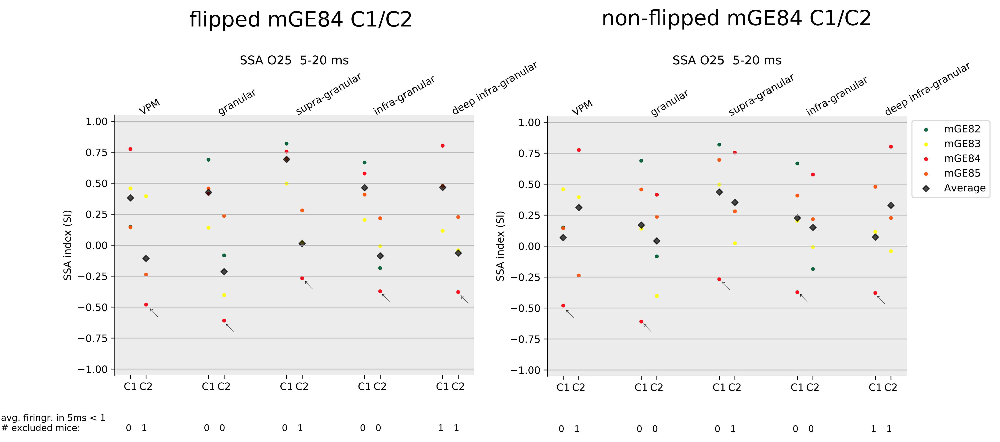

In [13]:
Image(filename= "../report/plots/fig5/mGE84_flipped.png")

#### SSA indices results: oddball 10%
The plots below show SSA indices of the oddball 10% paradigm when compared with the "predeviant" on the left and versus the many standards context on the right. In both comparisons we see distinct SSA along the thalamocortical regions. Interestingly, the SSA indices seem to increase with downstream sensory signal propagation. The initial SSA indices in VPM are relatively low and high in variance, which questions their validity when considering the small sample size of four mice. However, SSA indices in VPM remain around 0.1 when compared with the much stricter many standards paradigm. This supports the presents of SSA in VPM.Cortical SSA indices are higher than the ones in VPM. SSA increases from granular to supra- and infragranular layers; deep infragrnular is comparable with the infagranular response. Another consistent pattern in the data is that SSA indices are consistently lower in the adjacent whisker than in the principle whisker. The increase in response when the "deviant" is presented decreases when we record from the adjacent barrel. Hence, the SSA signal seems to be highest in the "deviant" barrel, then decreases when the stimulus is propagated within barrel cortex. This relation seems intuitive.<br>
As expected, the comparisons with the MS paradigm decreases SSA indices across all regions. Also, the difference between principle- and adjacent whisker disappears, which has no obvious explanation. 

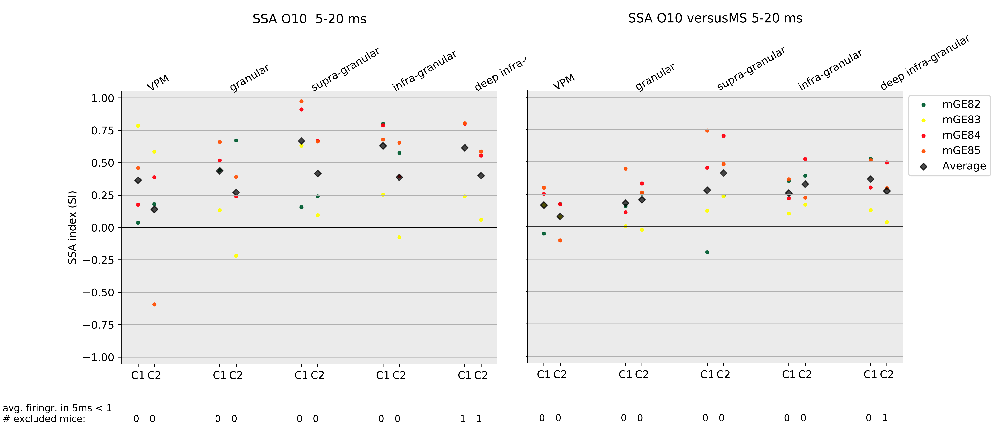

In [24]:
Image(filename= "../report/plots/fig6/SSA_10.png")

Late responses in the time window 100-200 ms may also encode SSA. The indices below were computed within that timeframe with a lower cut off response of 0.5 spikes per 5 ms activity. With a threshold of 1, almost all data points would have been cut which is why the threshold was changed from 1 to 0.5. Still, quite a few mice were excluded due to below threshold late responses. First, the pattern in the "predeviant" comparison where the principle whisker leads to higher SSA values than the adjacent one is conserved. Similar to the inital time frame 5-20 ms, there seems to be a trend throughout all the investigated regions that SSA is encoded in the late response. In order to pick up this effect, the electrode needs to directly record from the barrel matching the stimulated whisker. This idicates that this late response is limited to the specific barrel and is not propagated throughout the barrel field. The granular layer may be an exception in that regard. When compared with MS, most SSA effects vanish, except in the granular layer when the principle whisker is presented as the "devient".  

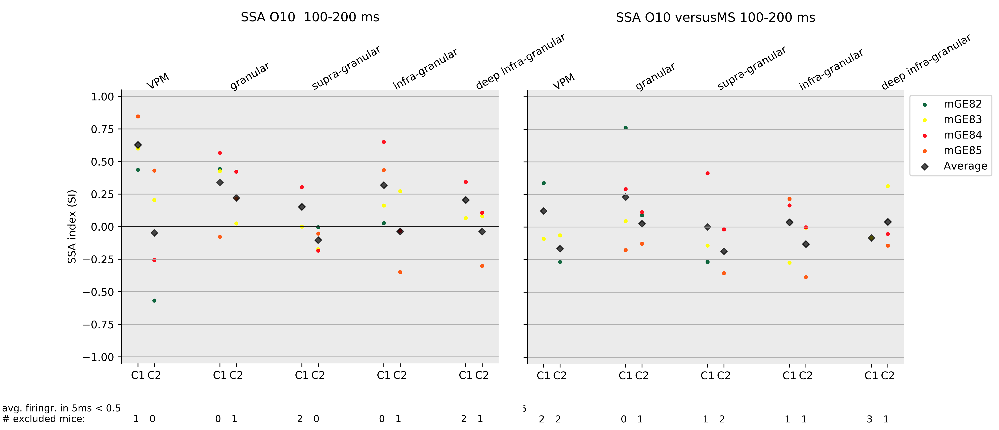

In [25]:
Image(filename= "../report/plots/fig6/SSA_10_late.png")

Next we asked ourselves if SSA indices might be correlated with each other. Perhaps low SSA in VPM could predict low cortical SSA. To conduct this analysis, each region was treated as an example with eight variables (columns), where each mouse (four) would have an SSA index for both C1 and C2. The Pearson correlation was then computed between different regions. If a specific mouse/whisker combination was NA (eg. `mGE82`;C2 below threshold responses), this specific variable was excluded for correlation. A minimum of five variables was needed for correlation to be computed. Within the cortical layers, SSA seems intercorrelated. SG differs from the other layers in that it is only significantly correlated with dIG, but not IG and G. SSA indices in G, IG and dIG are all strong correlated with each other. Interestingly, SSA index in VPM have a trend of being negatively correlated with G, IG and dIG. The p-values of this correlation are however not significant. To more closely investigate which data points drive this correlation, the single values plus a linear regression fit is plotted below. The strongest negative correlation is found between VPM and IG, but still, the data points don't resemble a convincing negative line. This effect could simply be noise resulting from the low sample size as it is also not observed in the 25% paradigm (see later). Since the relation of low SSA in VPM predicting high SSA in cortex and vice verso seems highly unintuitive, this trend was not further looked into.

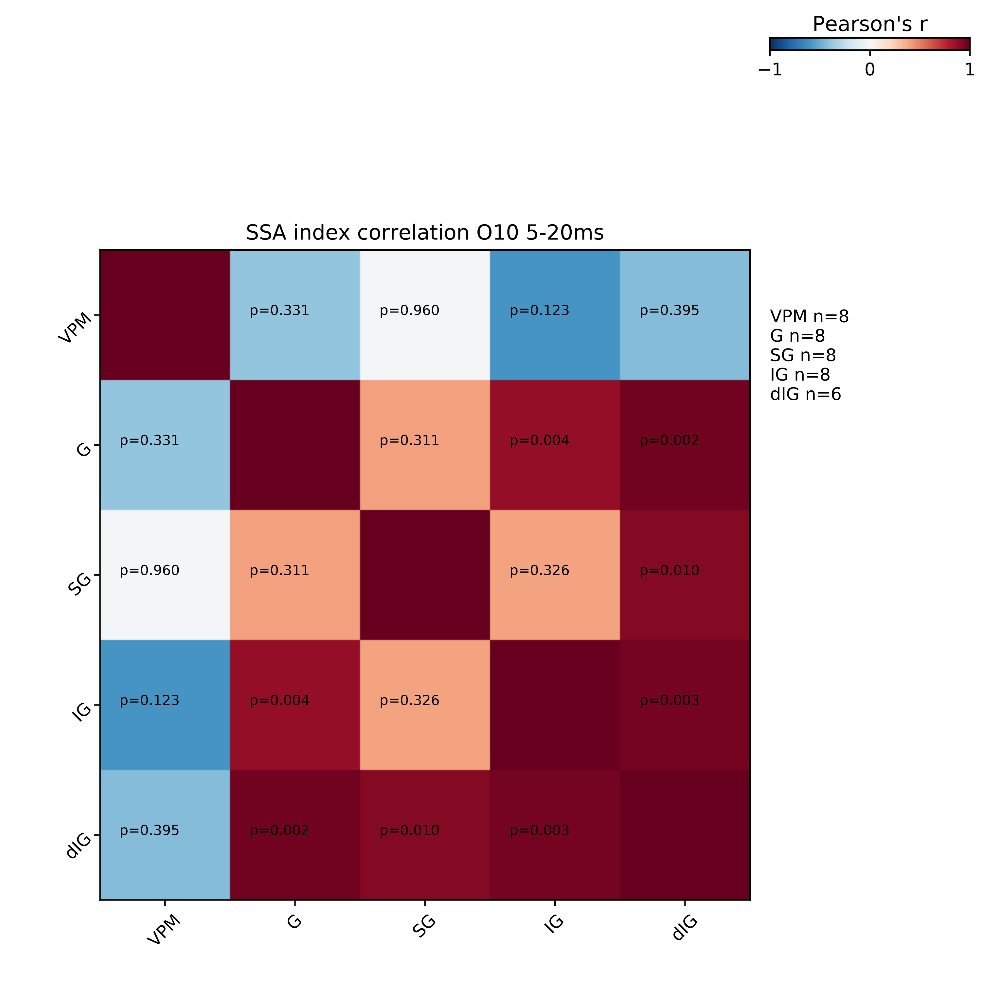

In [30]:
Image(filename= "../report/plots/fig6/SSA_corr_heatmap_O10_5_20ms_.png")

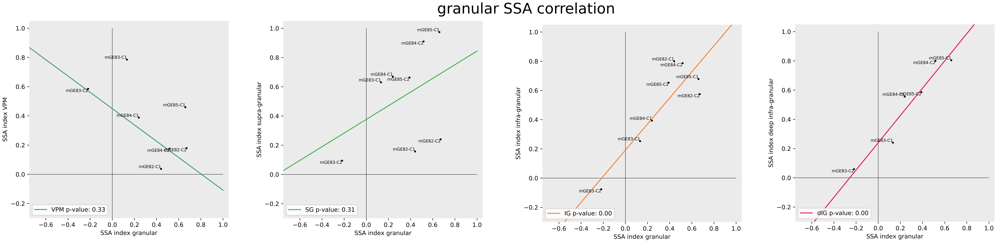

In [28]:
Image(filename= "../report/plots/fig6/G corr.png")

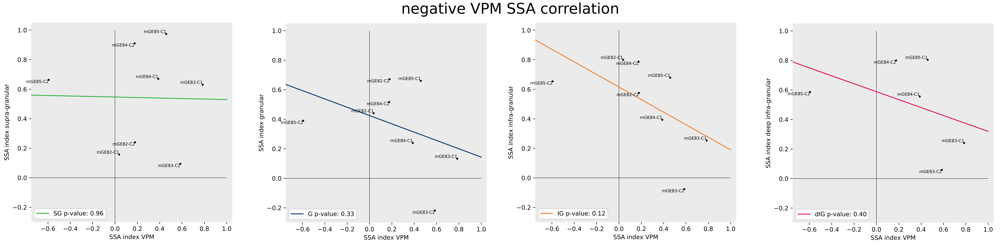

In [31]:
Image(filename= "../report/plots/fig6/VPM corr.png")

The same analysis was conducted for late responses to see if there is a relation between initial responses 5-20 ms and late responses 100-200 ms. The heatmap below can be a bit overwhelming, that is why the part already seen above is blurred out (top left). The right green box outlines the intercorrelation between late SSA, the left one shows the correlation with inital SSA. None of the computed correlation values reach p values lower than 0.05. Late IG and late dIG present an exception, however, the regression line below  is driven by a negative SSA outlier, most likely invalidating this positive correlation value. A similar arguemnt can be made for VPM SSA being seemingly positively correlated with late dIG and late IG SSA. Again, a look into the fitted regression line indicates that there is most likely no effect here. Overall, the SSA potentially encoded in late responses seems quite low. 

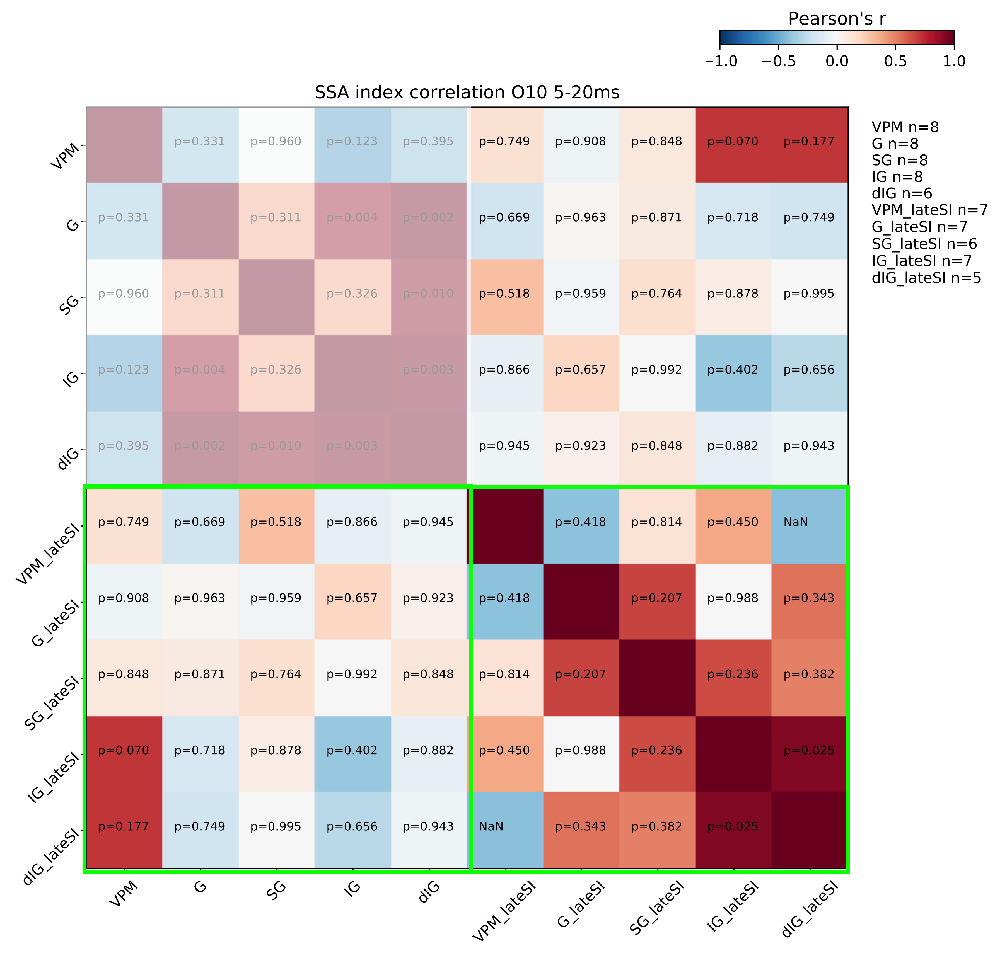

In [3]:
Image(filename= "../report/plots/fig6/SSA_corr_heatmap_O10_5_20ms_late.png")

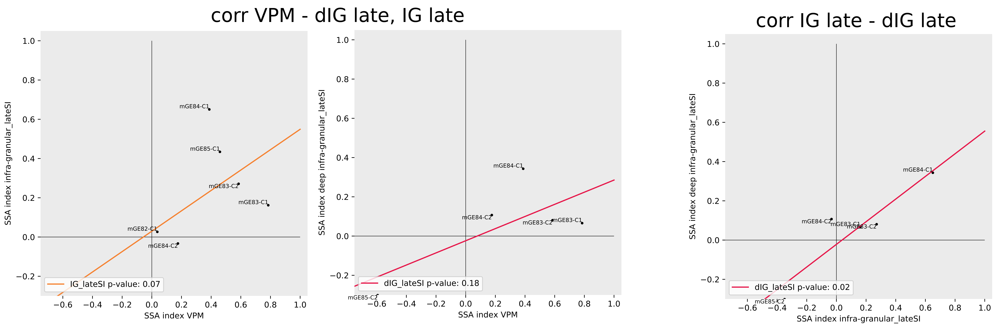

In [4]:
Image(filename= "../report/plots/fig6/late corr.png")

#### SSA indices results: oddball 25%
Two different versions of the oddball 25% paradigm were conducted. For O25, the "deviant" was presented randomely at a rate of 25%, in the O25U (uniform) paradigm, every forth whisker was the "deviant". SSA is still present when the "deviant" presentation rate decreases from 10% to 25%. The relative magnitude of SSA indices in specific regions follows the pattern seen in the 10% case. However, in contrast to the 10% case, SSA indices evaluate to 0 or lower when compared with the MS paradigm. When the "deviant" is presented randomly instead of uniformly, the SSA in the adjacent whisker drops below the prinicple levels by a large margin. Interestingly, this drop is not observed in the uniform scenario. Thus, it seems that SSA signalling will rather be propagated to adjacent barrels when the stimulus is presented uniformly. The random case may still lead to SSA being picked up for adjacent barrels, but it is contingent on the low presentation rate of 10%. In the 25%, random case, SSA signals seem to be less propagated througout the barrel field.  <br>
Correlation of region specific SSA yields also similar results to the 10% case. In contrary however, SG SSA also correlates with deeper cortical layers. Also, the previously neagtive correlation in the 10% case is no longer detected. Instead, there seems to be a weak, non significant trend towards positive correlation of thalamic and coritcal SSA. Late responses were rarely picked up in these 25% paradigms and are therefore not shown. 


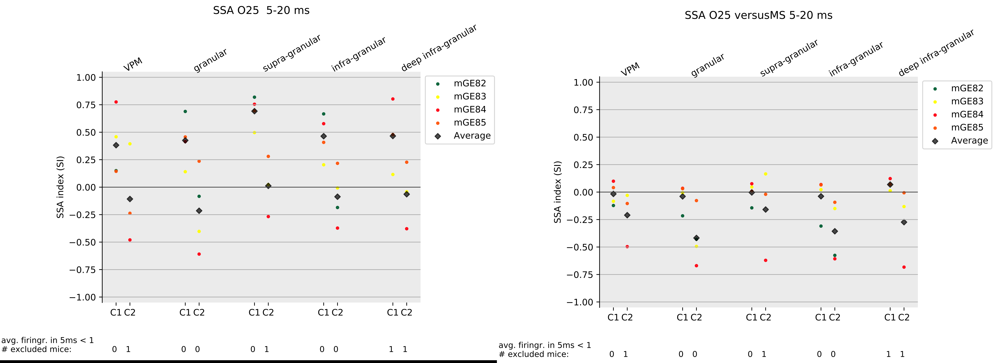

In [10]:
Image(filename= "../report/plots/fig7/25  SSA.png")

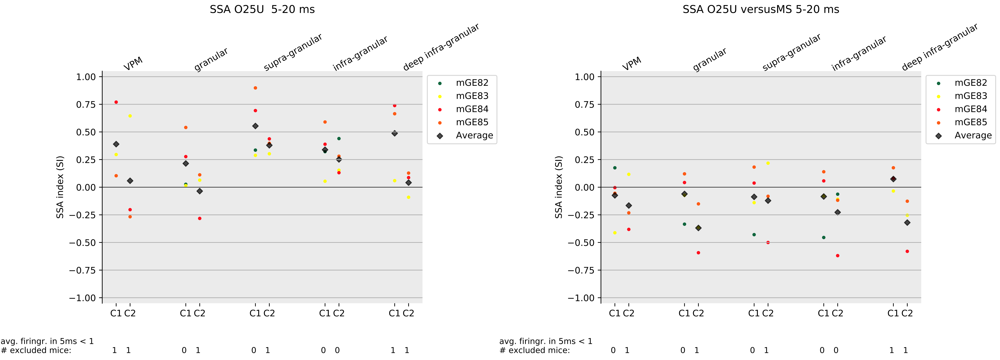

In [12]:
Image(filename= "../report/plots/fig7/25U  SSA.png")

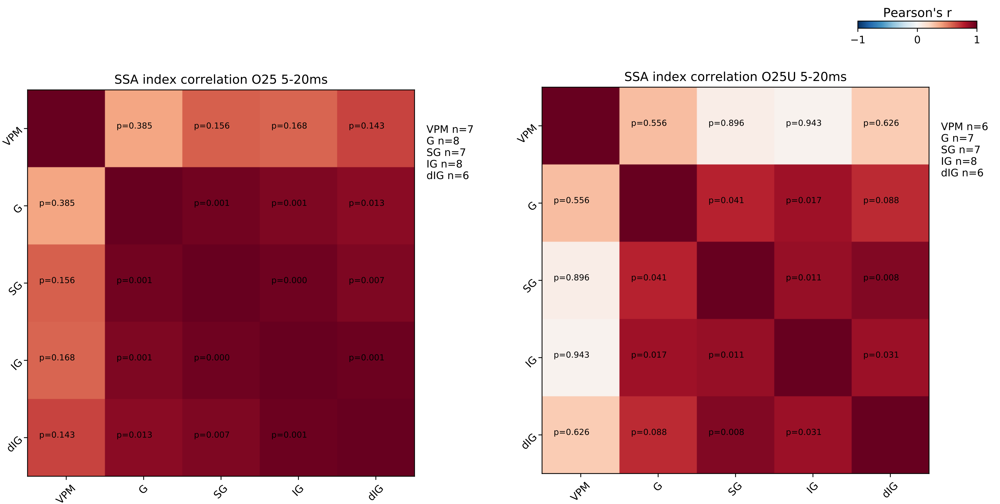

In [13]:
Image(filename= "../report/plots/fig7/25 corr.png")